In [1]:
"""
General utils for training, evaluation and data loading
"""
import os
import torch
import pickle
import numpy as np
import torchvision.transforms as transforms

from PIL import Image

from torch.utils.data import BatchSampler
from torch.utils.data import Dataset, DataLoader

# General
BASE_DIR = ''
N_ATTRIBUTES = 312
N_CLASSES = 200

# Training
UPWEIGHT_RATIO = 9.0
MIN_LR = 0.0001
LR_DECAY_SIZE = 0.1

class CUBDataset(Dataset):
    """
    Returns a compatible Torch Dataset object customized for the CUB dataset
    """

    def __init__(self, pkl_file_paths, use_attr, no_img, uncertain_label, image_dir, n_class_attr, transform=None):
        """
        Arguments:
        pkl_file_paths: list of full path to all the pkl data
        use_attr: whether to load the attributes (e.g. False for simple finetune)
        no_img: whether to load the images (e.g. False for A -> Y model)
        uncertain_label: if True, use 'uncertain_attribute_label' field (i.e. label weighted by uncertainty score, e.g. 1 & 3(probably) -> 0.75)
        image_dir: default = 'images'. Will be append to the parent dir
        n_class_attr: number of classes to predict for each attribute. If 3, then make a separate class for not visible
        transform: whether to apply any special transformation. Default = None, i.e. use standard ImageNet preprocessing
        """
        self.data = []
        self.is_train = any(["train" in path for path in pkl_file_paths])
        if not self.is_train:
            assert any([("test" in path) or ("val" in path) for path in pkl_file_paths])
        for file_path in pkl_file_paths:
            self.data.extend(pickle.load(open(file_path, 'rb')))
        self.transform = transform
        self.use_attr = use_attr
        self.no_img = no_img
        self.uncertain_label = uncertain_label
        self.image_dir = image_dir
        self.n_class_attr = n_class_attr

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_data = self.data[idx]
        img_path = img_data['img_path']
        
        # Trim unnecessary paths
        try:
            idx = img_path.split('/').index('CUB_200_2011')
            if self.image_dir != 'images':
                img_path = '/'.join([self.image_dir] + img_path.split('/')[idx+1:])
                img_path = img_path.replace('images/', '')
            else:
                img_path = '/'.join(img_path.split('/')[idx:])
            img = Image.open(img_path).convert('RGB')
        except:
            #img_path_split = img_path.split('/')
            #split = 'train' if self.is_train else 'test'
            #img_path = '/'.join(img_path_split[:2] + [split] + img_path_split[2:])
            
            img = Image.open(img_path).convert('RGB')

        class_label = img_data['class_label']
        if self.transform:
            img_transformed = self.transform(img)

        if self.use_attr:
            if self.uncertain_label:
                attr_label = img_data['uncertain_attribute_label']
            else:
                attr_label = img_data['attribute_label']
            if self.no_img:
                if self.n_class_attr == 3:
                    one_hot_attr_label = np.zeros((N_ATTRIBUTES, self.n_class_attr))
                    one_hot_attr_label[np.arange(N_ATTRIBUTES), attr_label] = 1
                    return one_hot_attr_label, class_label
                else:
                    return attr_label, class_label
            else:
                return img, class_label, attr_label
        else:
            return img, class_label, img_transformed


class ImbalancedDatasetSampler(torch.utils.data.sampler.Sampler):
    """Samples elements randomly from a given list of indices for imbalanced dataset
    Arguments:
        indices (list, optional): a list of indices
        num_samples (int, optional): number of samples to draw
    """

    def __init__(self, dataset, indices=None):
        # if indices is not provided,
        # all elements in the dataset will be considered
        self.indices = list(range(len(dataset))) \
            if indices is None else indices

        # if num_samples is not provided,
        # draw `len(indices)` samples in each iteration
        self.num_samples = len(self.indices)

        # distribution of classes in the dataset
        label_to_count = {}
        for idx in self.indices:
            label = self._get_label(dataset, idx)
            if label in label_to_count:
                label_to_count[label] += 1
            else:
                label_to_count[label] = 1

        # weight for each sample
        weights = [1.0 / label_to_count[self._get_label(dataset, idx)]
                   for idx in self.indices]
        self.weights = torch.DoubleTensor(weights)

    def _get_label(self, dataset, idx):  # Note: for single attribute dataset
        return dataset.data[idx]['attribute_label'][0]

    def __iter__(self):
        idx = (self.indices[i] for i in torch.multinomial(
            self.weights, self.num_samples, replacement=True))
        return idx

    def __len__(self):
        return self.num_samples

def load_data(pkl_paths, use_attr, no_img, batch_size, uncertain_label=False, n_class_attr=2, image_dir='images', resampling=False, resol=299):
    """
    Note: Inception needs (299,299,3) images with inputs scaled between -1 and 1
    Loads data with transformations applied, and upsample the minority class if there is class imbalance and weighted loss is not used
    NOTE: resampling is customized for first attribute only, so change sampler.py if necessary
    """
    resized_resol = int(resol * 256/224)
    is_training = any(['train.pkl' in f for f in pkl_paths])
    

    transform = transforms.Compose([
                transforms.Resize(256),
                transforms.CenterCrop(224),
                #transforms.Normalize(mean = [0.5, 0.5, 0.5], std = [2, 2, 2]),
                transforms.ToTensor()
            ])

    dataset = CUBDataset(pkl_paths, use_attr, no_img, uncertain_label, image_dir, n_class_attr, transform)
    if is_training:
        drop_last = True
        shuffle = True
    else:
        drop_last = False
        shuffle = False
    if resampling:
        sampler = BatchSampler(ImbalancedDatasetSampler(dataset), batch_size=batch_size, drop_last=drop_last)
        loader = DataLoader(dataset, batch_sampler=sampler)
    else:
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, drop_last=drop_last)
    return loader

def find_class_imbalance(pkl_file, multiple_attr=False, attr_idx=-1):
    """
    Calculate class imbalance ratio for binary attribute labels stored in pkl_file
    If attr_idx >= 0, then only return ratio for the corresponding attribute id
    If multiple_attr is True, then return imbalance ratio separately for each attribute. Else, calculate the overall imbalance across all attributes
    """
    imbalance_ratio = []
    data = pickle.load(open(os.path.join(BASE_DIR, pkl_file), 'rb'))
    n = len(data)
    n_attr = len(data[0]['attribute_label'])
    if attr_idx >= 0:
        n_attr = 1
    if multiple_attr:
        n_ones = [0] * n_attr
        total = [n] * n_attr
    else:
        n_ones = [0]
        total = [n * n_attr]
    for d in data:
        labels = d['attribute_label']
        if multiple_attr:
            for i in range(n_attr):
                n_ones[i] += labels[i]
        else:
            if attr_idx >= 0:
                n_ones[0] += labels[attr_idx]
            else:
                n_ones[0] += sum(labels)
    for j in range(len(n_ones)):
        imbalance_ratio.append(total[j]/n_ones[j] - 1)
    if not multiple_attr: #e.g. [9.0] --> [9.0] * 312
        imbalance_ratio *= n_attr
    return imbalance_ratio

In [2]:
!pip install gdown

In [3]:
!gdown 1DUkovCVCUqYScle624llHyeUuC7t0SaN #images
!gdown 1oRBQ7WY_9-qfWkxNC7ZGBW27wecfEy6f #train.pkl
!gdown 1EsYvhX6aRDELjoKpcRo3fuLo-aKF6DI9 #test.pkl
!gdown 1ir5HukW2XO25GWqx3jV-gKZWWi6Zg_rw #val.pkl
!gdown 1PFu7qcTS2tURPKCKYGJbosXrhFO3U1yu #model.pth

Downloading...
From (uriginal): https://drive.google.com/uc?id=1DUkovCVCUqYScle624llHyeUuC7t0SaN
From (redirected): https://drive.google.com/uc?id=1DUkovCVCUqYScle624llHyeUuC7t0SaN&confirm=t&uuid=dda2901f-bdea-462a-869f-8e7e96257005
To: /kaggle/working/images.zip
100%|██████████████████████████████████████| 1.13G/1.13G [00:26<00:00, 42.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1oRBQ7WY_9-qfWkxNC7ZGBW27wecfEy6f
To: /kaggle/working/kaggle_train.pkl
100%|████████████████████████████████████████| 497k/497k [00:00<00:00, 94.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1EsYvhX6aRDELjoKpcRo3fuLo-aKF6DI9
To: /kaggle/working/kaggle_test.pkl
100%|████████████████████████████████████████| 601k/601k [00:00<00:00, 85.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ir5HukW2XO25GWqx3jV-gKZWWi6Zg_rw
To: /kaggle/working/kaggle_val.pkl
100%|████████████████████████████████████████| 124k/124k [00:00<00:00, 44.3MB/s]
Downloading...
From (uriginal): https://drive.

In [4]:
import zipfile

with zipfile.ZipFile('./images.zip',"r") as z:
    z.extractall()

Dataset loader from bottleneck concept script

In [5]:


train_data_path="/kaggle/working/kaggle_train.pkl"
val_data_path="/kaggle/working/kaggle_val.pkl"

train_loader = load_data([train_data_path], use_attr=False, no_img=False, batch_size=64, uncertain_label=False, image_dir="", n_class_attr=0)
val_loader = load_data([val_data_path], use_attr=False, no_img=False, batch_size=64, uncertain_label=False, image_dir="", n_class_attr=0)

In [6]:
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

model = models.resnet18()
num_classes = 200
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load('resnet18_trained.pth'))



<All keys matched successfully>

In [7]:
import torch
from torch.autograd import Variable

def compute_saliency_maps(images, labels, model):
    # Make sure the model is in evaluation mode
    model.eval()

    # Convert the images and labels to variables
    images = Variable(images, requires_grad=True)
    labels = Variable(labels)

    # Forward pass
    output = model(images)
    loss = torch.nn.functional.cross_entropy(output, labels)

    # Backward pass
    loss.backward()

    # Get the gradients of the input with respect to the loss
    gradients = images.grad.data

    # Absolute value of the gradients
    gradients = torch.abs(gradients)

    # Max of the gradients across the channels
    gradients, _ = torch.max(gradients, dim=1)

    # Normalize the gradients
    gradients = torch.div(gradients, torch.max(gradients))

    return gradients

In [12]:
import matplotlib.pyplot as plt
import numpy 
import cv2

test_data_path = "/kaggle/working/kaggle_test.pkl"
test_loader = load_data([test_data_path], use_attr=False, no_img=False, batch_size=64, uncertain_label=False, image_dir="", n_class_attr=0)
# Choose a few images from the test set
img_list=[]
saliency_maps_list=[]
for images, labels in test_loader: #computing saliency maps for the whole dataset

# Compute the saliency maps
    img_list.append(images)
    saliency_maps_list.append(compute_saliency_maps(images, labels, model))
    break
    
images_all= torch.cat(img_list)
saliency_maps= torch.cat(saliency_maps_list)
print(saliency_maps.shape)
saliency_maps=saliency_maps.numpy().transpose(1, 2, 0)

AttributeError: 'builtin_function_or_method' object has no attribute 'append'

Saliency maps with different data loader

Testing different ways of displaying maps

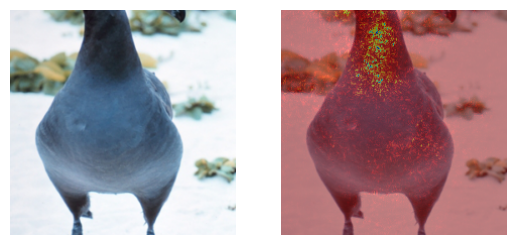

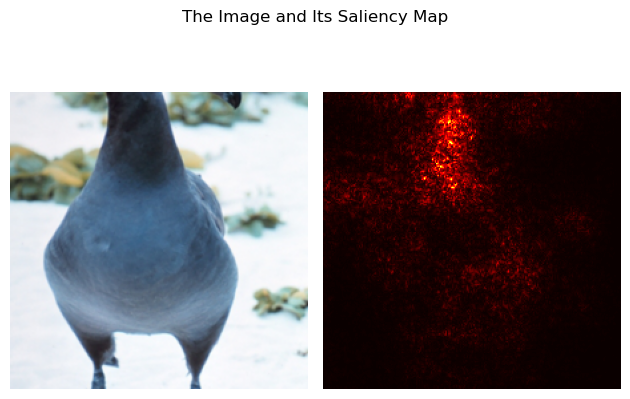

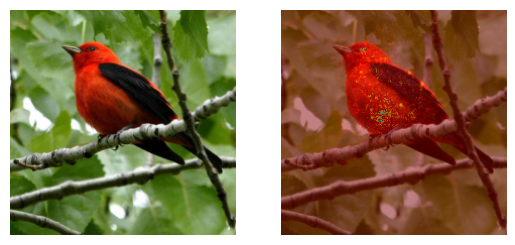

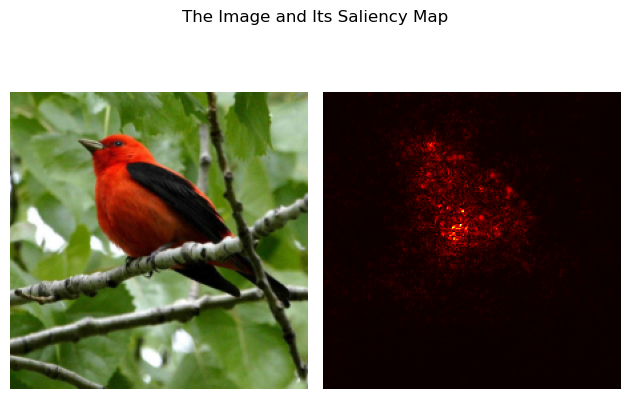

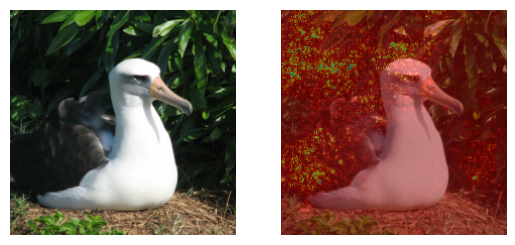

...

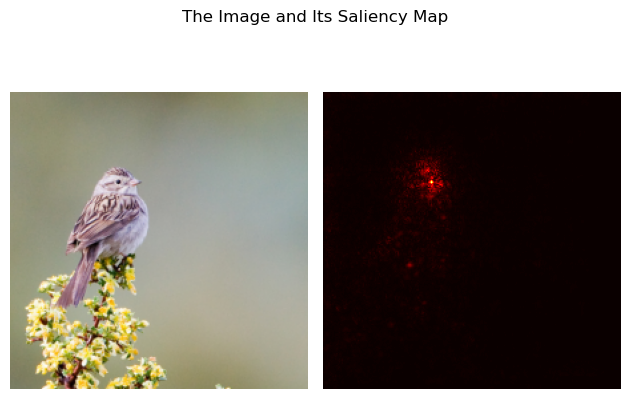

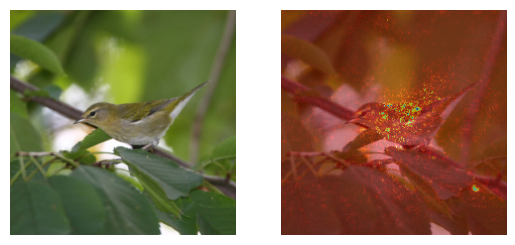

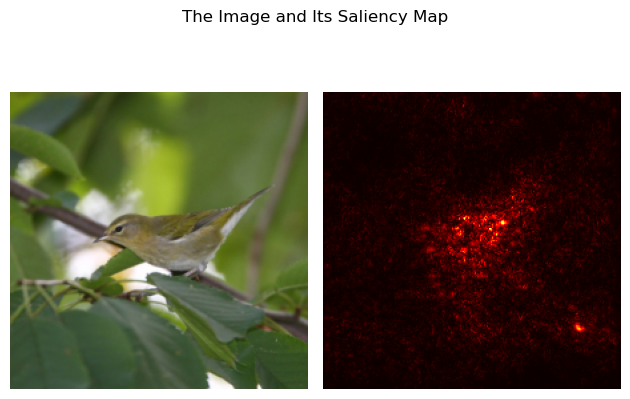

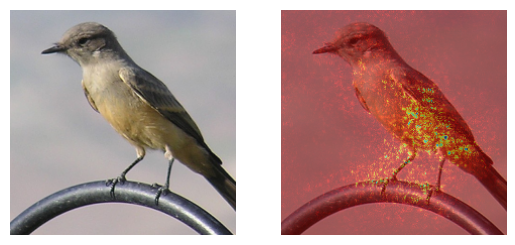

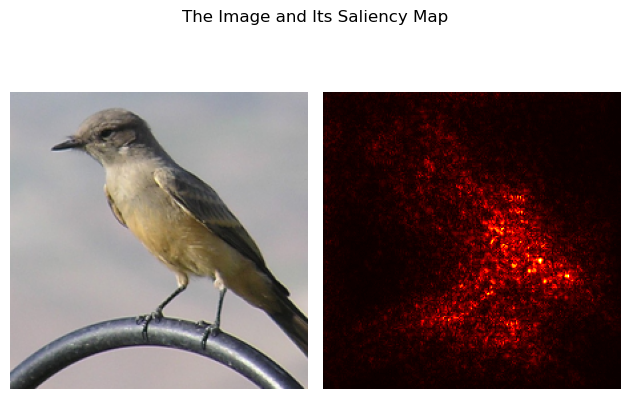

In [20]:
import random

img_idx = random.sample(range(0, images_all.shape[0]), 20)

for i in img_idx:
    sal_map =  saliency_maps[:,:, i]
    
    # Convert the saliency map to a heatmap and normalize it between 0 and 1
    heatmap = np.uint8(255 * saliency_maps[:,:, i]/np.max(saliency_maps[:,:, i]))
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255

    # Resize the heatmap to the size of the original image
    heatmap = cv2.resize(heatmap, (images_all.size(-1), images_all.size(-2)))
    #heatmap = np.transpose(heatmap, (2, 0, 1))
    
    # Overlay the heatmap on the original image
    cam = heatmap + np.float32(images_all[i].squeeze().numpy().transpose((1, 2, 0)))
    cam = cam / np.max(cam)
    plt.figure()
    plt.subplot(121)
    plt.imshow(images_all[i].permute(1, 2, 0))
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(cam)
    plt.axis('off')
    plt.show()

    # Visualize the image and the saliency map
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(images_all[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax[0].axis('off')
    ax[1].imshow(sal_map, cmap='hot')
    ax[1].axis('off')
    plt.tight_layout()
    fig.suptitle('The Image and Its Saliency Map')
    plt.show()

# grad CAM 
Not really working, still need some 

In [ ]:
!pip install grad-cam

In [28]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50


target_layers = [model.layer4[-1]]
input_tensor = images_all[img_idx,:,:,:]# Create an input tensor image for your model..
# Note: input_tensor can be a batch tensor with several images!

# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=False)

# You can also use it within a with statement, to make sure it is freed,
# In case you need to re-create it inside an outer loop:
# with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
#   ...

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.

targets = None

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# In this example grayscale_cam has only one image in the batch:
grayscale_cam = grayscale_cam[1, :]


In [37]:
grayscale_cam = grayscale_cam[1, :]

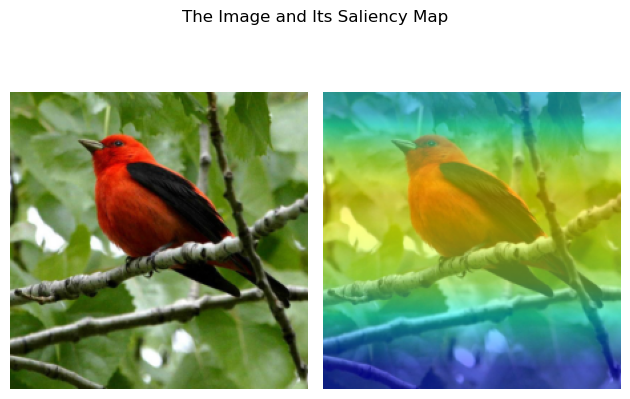

In [38]:
visualization = show_cam_on_image(images_all[img_idx[1]].squeeze().numpy().transpose((1, 2, 0)), grayscale_cam, use_rgb=True)

# Visualize the image and the saliency map
fig, ax = plt.subplots(1, 2)
ax[0].imshow(images_all[img_idx[1]].squeeze().numpy().transpose((1, 2, 0)))
ax[0].axis('off')
ax[1].imshow(visualization, cmap='hot')
ax[1].axis('off')
plt.tight_layout()
fig.suptitle('The Image and Its Saliency Map')
plt.show()

Some metrics - in development

In [34]:
from pytorch_grad_cam.utils.model_targets import ClassifierOutputSoftmaxTarget
from pytorch_grad_cam.metrics.cam_mult_image import CamMultImageConfidenceChange
# Create the metric target, often the confidence drop in a score of some category
metric_target = ClassifierOutputSoftmaxTarget(281)
scores, batch_visualizations = CamMultImageConfidenceChange()(input_tensor, 
  inverse_cams, targets, model, return_visualization=True)
visualization = deprocess_image(batch_visualizations[0, :])

# State of the art metric: Remove and Debias
from pytorch_grad_cam.metrics.road import ROADMostRelevantFirst, ROADLeastRelevantFirst
cam_metric = ROADMostRelevantFirst(percentile=75)
scores, perturbation_visualizations = cam_metric(input_tensor, 
  grayscale_cams, targets, model, return_visualization=True)

# You can also average accross different percentiles, and combine
# (LeastRelevantFirst - MostRelevantFirst) / 2
from pytorch_grad_cam.metrics.road import ROADMostRelevantFirstAverage,ROADLeastRelevantFirstAverage,ROADCombined
cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
scores = cam_metric(input_tensor, grayscale_cams, targets, model)

NameError: name 'inverse_cams' is not defined